# Import Python packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

import torch
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import nn
from torch.nn import  functional as F

In [2]:
from sklearn.neural_network import MLPRegressor

# Make dataset

In [3]:
pd_train = pd.read_excel("D:/database/data_all_strain-controlled.xls",nrows=100000)#Change this path to your own path 
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Unnamed: 5,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,NaN,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,NaN,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,NaN,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,NaN,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,NaN,3.409764


In [4]:
pd_train.drop(columns=['Unnamed: 5'],inplace=True)
pd_train

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304000,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304000,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304000,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304000,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304000,3.409764
...,...,...,...,...,...,...
909,AZ31B-4-0.004-0.0069.csv,44.8,298.0,244.0,0.325444,3.281033
910,AZ31B-4-0.005-0.0087.csv,44.8,298.0,244.0,0.325444,2.763428
911,AZ31B-4-0.0075-0.013.csv,44.8,298.0,244.0,0.325444,2.255273
912,AZ31B-4-0.0100-0.0173.csv,44.8,298.0,244.0,0.325444,1.832509


In [5]:
pd_train.shape

(914, 6)

In [6]:
pd_train['Nf(label)'].value_counts()

Nf(label)
2.838849    4
3.429914    3
2.763428    3
3.152288    3
2.602060    3
           ..
2.819544    1
2.444045    1
2.822168    1
2.735599    1
1.544068    1
Name: count, Length: 872, dtype: int64

In [7]:
pd_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914 entries, 0 to 913
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   load       914 non-null    object 
 1   E(Gpa)     914 non-null    float64
 2   TS(Mpa)    914 non-null    float64
 3   ss（Mpa）    914 non-null    float64
 4   m          914 non-null    float64
 5   Nf(label)  914 non-null    float64
dtypes: float64(5), object(1)
memory usage: 43.0+ KB


# Read csv files

In [8]:
csv_path = 'D:/database/All data_Strain/'#Change this path to your own path

In [9]:
csv_files = pd_train['load'].values
csv_files[:5]

array(['q235b-0.002.csv', 'q235b-0.003.csv', 'q235b-0.004.csv',
       'q235b-0.005.csv', 'q235b-0.006.csv'], dtype=object)

In [10]:
one_df = pd.read_csv(csv_path+csv_files[10],header=None)
one_df.head()


,0,1
0,0.0,0.000000
1,0.0,0.000144
2,0.0,0.000289
3,0.0,0.000433
4,0.0,0.000577


In [11]:
pd.read_csv(csv_path+'E355-20-14-0.0036-0.0061.csv',header=None).iloc[:,:2]

,0,1
0,0.000000,0.000000
1,0.000932,0.001112
2,0.001800,0.002186
3,0.002546,0.003187
4,0.003118,0.004082
...,...,...
236,-0.003118,-0.004082
237,-0.002546,-0.003187
238,-0.001800,-0.002186
239,-0.000932,-0.001112


In [12]:
value_list = []
for i in range(len(csv_files)):
    try:
      # print(csv_files[i])
      one_df = pd.read_csv(csv_path+csv_files[i],header=None).iloc[:,:2]
      value_list.append(one_df.values)
      print(one_df.shape)
    except:
      print(csv_path+csv_files[i] , 'no here ')

(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(241, 2)
(

# Merge into a large array

In [13]:
csv_value_array = np.array(value_list)
csv_value_array.shape

(914, 241, 2)

In [14]:
flatten_value_list = [item.flatten() for item in  value_list]
flatten_value_list[0].shape

(482,)

<Axes: >

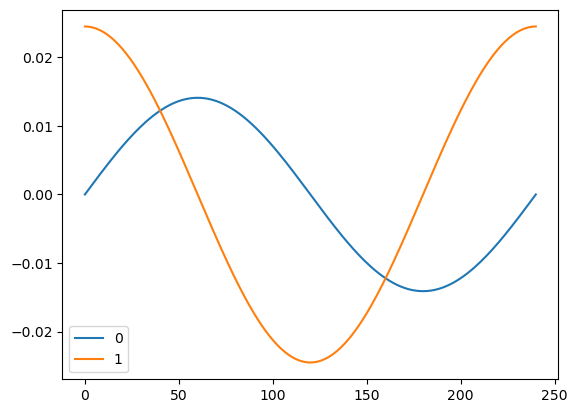

In [15]:
one_df.plot()

# Data processing pipline

In [16]:
pd_train.head()

,load,E(Gpa),TS(Mpa),ss（Mpa）,m,Nf(label)
0,q235b-0.002.csv,206.0,412.0,235.0,0.304,4.427583
1,q235b-0.003.csv,206.0,412.0,235.0,0.304,4.071256
2,q235b-0.004.csv,206.0,412.0,235.0,0.304,3.812111
3,q235b-0.005.csv,206.0,412.0,235.0,0.304,3.573104
4,q235b-0.006.csv,206.0,412.0,235.0,0.304,3.409764


In [17]:
# Filter out columns of non object type
num_cols = pd_train.select_dtypes(exclude=['object']).columns.tolist()[:-1]

print("Non-object columns:", num_cols)

Non-object columns: ['E(Gpa)', 'TS(Mpa)', 'ss（Mpa）', 'm']


In [18]:
num_si_step = ('si', SimpleImputer(strategy='median'))
num_ss_step = ('ss', StandardScaler()) #Normalization of mean standard deviation
num_steps = [num_si_step, num_ss_step]

num_pipe = Pipeline(num_steps)
num_transformers = [('num', num_pipe, num_cols)]

ct = ColumnTransformer(transformers=num_transformers)

x_all = ct.fit_transform(pd_train)
x_all.shape

(914, 4)

In [19]:
x_all[:5]

array([[ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
       [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619]])

In [20]:
y_all = pd_train['Nf(label)'].values
y_all.shape,y_all[:10]

((914,),
 array([4.42758347, 4.07125588, 3.81211084, 3.57310378, 3.4097641 ,
        3.0374265 , 4.61187194, 4.30209272, 3.98421217, 3.88109922]))

In [21]:
dim_num = x_all.shape[-1]
dim_num

4

# Divide the dataset and test set

In [22]:
from sklearn.model_selection import train_test_split

# x_all_new, csv_value_array, y_all are 3 NumPy arrays
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test,csv_files_train, csv_files_test = train_test_split(x_all, csv_value_array, y_all,csv_files, test_size=0.2, random_state=42)
# The dataset was randomly divided into training and testing sets with a ratio of 8:2, which may lead to slight variations in the results for each model.
print("The size of the training set：", x_train.shape[0])
print("The size of the test set：", x_test.shape[0])
x_train.shape, x_test.shape, csv_value_train.shape, csv_value_test.shape, y_train.shape, y_test.shape

训练集的大小： 731
测试集的大小： 183


((731, 4), (183, 4), (731, 241, 2), (183, 241, 2), (731,), (183,))

# Pytorch dataset dataloader
   
  Prepare Dataset

In [23]:
x_train, x_test, csv_value_train, csv_value_test, y_train, y_test

(array([[-1.40434922, -0.91169623, -0.35126438, -0.20713854],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.10796619],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854],
        ...,
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.87982918,  3.82676089,  3.69451712, -0.20713854],
        [ 0.67425312, -0.63873605, -0.48032664, -0.20713854]]),
 array([[ 0.8716714 ,  0.47814685,  0.67391102, -0.20713854],
        [-1.82365911, -1.04108102, -0.73570516,  0.29174678],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.93693364,  0.06703711, -0.12975327,  0.04079234],
        [ 0.6677269 ,  2.3980502 ,  2.73799185, -0.87655194],
        [-1.42066478, -0.78648514, -0.8409687 ,  0.53665412],
        [-0.37646894, -0.67796886, -0.98284566,  0.53665412],
        [-1.41577011, -1.24934879, -0.7379935 ,  1.0325159 ],
        [ 0.8308825 , -0.48597853, -0.53890809, -0.1079

In [24]:
from torch.utils.data import TensorDataset

train_ds = TensorDataset(torch.tensor(x_train).float(),torch.tensor(csv_value_train).float(), torch.tensor(y_train).float().unsqueeze(1))
test_ds = TensorDataset(torch.tensor(x_test).float(),torch.tensor(csv_value_test).float(), torch.tensor(y_test).float().unsqueeze(1))

In [25]:
len(train_ds), len(test_ds)

(731, 183)

# Prepare dataloader

In [26]:
batch_size = 20
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [27]:
train_dl

# Check shape of the input data

In [28]:
for b_x, b_x_csv,b_y in test_dl:
  print(b_x.shape)
  print(b_x_csv.shape)
  print(b_y.shape)
  break

torch.Size([20, 4])
torch.Size([20, 241, 2])
torch.Size([20, 1])


In [29]:
b_y

tensor([[3.8176],
        [4.4358],
        [5.6955],
        [2.8451],
        [5.9240],
        [3.6521],
        [4.6064],
        [3.3818],
        [4.3040],
        [3.1956],
        [4.4381],
        [2.3711],
        [3.0817],
        [3.8833],
        [2.8331],
        [3.8063],
        [3.4143],
        [4.2310],
        [4.9761],
        [3.5997]])

# Prepare for training

In [30]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X,x_csv, y) in enumerate(dataloader):
        X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

        # Compute prediction error
        pred = model(X,x_csv)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 5 == 0:
            loss, current = loss.item(), (batch + 1) * len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for (X,x_csv, y) in dataloader:
            X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

            pred = model(X,x_csv)
            test_loss += loss_fn(pred, y).item()
    test_loss /= num_batches
    print(f"Avg loss: {test_loss:>8f} \n")
    return test_loss

In [31]:
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")

Using cuda device


# Build model
  structural data part

In [32]:
class DNNModel(nn.Module):
    def __init__(self,):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.lin1 = nn.Linear(dim_num,200)
        self.lin2 = nn.Linear(200,100)
        self.lin3 = nn.Linear(100,100)
        self.out = nn.Linear(10, 1)
        self.flatten = nn.Flatten()

    def forward(self, x):

        x= F.relu(self.lin1(x))
        x= F.relu(self.lin2(x))
        x= F.relu(self.lin3(x))
        # x = self.out(x)

        return x
dnn_block = DNNModel().to(device)

dnn_block(b_x.to(device)).shape

torch.Size([20, 100])

GRU part

In [33]:
class GRUModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.nor = nn.BatchNorm1d(dim_num)
        self.gru = nn.GRU(input_size=2, hidden_size=5, batch_first=True)
        self.flatten = nn.Flatten()
        self.lin1 = nn.Linear(1205, 100)  # Pretend the input size to be(32, 241, 5)

    def forward(self, x):
        x, _ = self.gru(x)
        x = self.flatten(x)
        x = self.lin1(x)
        return x


# Instantiating the GRU model
gru_block = GRUModel().to(device)
gru_block(b_x_csv.to(device)).shape


torch.Size([20, 100])

Merge models

In [34]:
class bigModel(nn.Module):
    def __init__(self, ):
        super().__init__()
        self.strct_block = dnn_block
        self.gru_block = gru_block
        #self.f_block = f_block
        #self.cnn_block = cnn_block

        self.flatten = nn.Flatten()
        self.att = nn.TransformerEncoderLayer(100,2)

        self.lin1 = nn.Linear(200, 100)
        self.lin2 = nn.Linear(100, 100)
        self.out = nn.Linear(100, 1)
    def forward(self, b_x, b_x_csv):
        x_strct = self.strct_block(b_x)
        x_gru = self.gru_block(b_x_csv)
        #x_f = self.f_block(b_x_csv)
        #x_cnn = self.cnn_block(b_x_csv)
        x = torch.stack((x_strct, x_gru), dim=1)
        print(x.shape)
        #x = self.att(x)
        x = self.flatten(x)
        print(x.shape)
        x = F.relu(self.lin1(x))
        #x = torch.cat((x, x_f), dim=1)
        #print(x.shape)
        x = F.relu(self.lin2(x))
        x = self.out(x)
        return x

big_model = bigModel().to(device)
big_model(b_x.to(device), b_x_csv.to(device)).shape

torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 1])

Loss function and optimizer

In [35]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.AdamW(big_model.parameters(), lr=1e-3)

Training and testing

In [36]:
# Initialize Best Test Loss
best_test_loss = float('inf')

epochs = 3000
train_loss_list = []
test_loss_list = []

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dl, big_model, loss_fn, optimizer)
    train_loss = test(train_dl, big_model, loss_fn)
    test_loss = test(test_dl, big_model, loss_fn)

    train_loss_list.append(train_loss)
    test_loss_list.append(test_loss)

    # Save Best Model Weights
    if test_loss < best_test_loss:
        best_test_loss = test_loss
        torch.save(big_model.state_dict(), 'best_model_weights_GRU.pth')
        print(f"Best model saved! loss is {best_test_loss}")

print("Done!")

# Load Best Model Weights
best_model = big_model
best_model.load_state_dict(torch.load('best_model_weights_GRU.pth'))
best_model.eval()  # Set the model to evaluation mode and disable the impact of Dropout and Batch Normalization


Epoch 1
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 11.484881  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 10.356246  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.995608  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.862139  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.607375  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.464113  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.475765  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.861206  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.426145  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.595380  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.269657  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.573129  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

Best model saved! loss is 0.6347350120544434
Epoch 7
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.495230  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.511094  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.215938  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.622144  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.821896  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.798662  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.953615  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.536184  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.851464  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.516829  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.991690  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.584739  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.891578  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.533126  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.250001  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.374405  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.310145  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.618263  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.531150  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.663960  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.453005  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.342282  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.473878  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.388483  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.341559  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.483955  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.812479  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.508119  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.482093 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.221467  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.324710  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.422707  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.473621  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.653369  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.518604  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.556870  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.379503  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.438992  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.531066  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.414724  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.544990  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.504170  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.624046  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.276772  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.589895  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.286866  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.389526  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.548942 

Best model saved! loss is 0.548942357301712
Epoch 51
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.465777  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.483619  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.620078  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.498479  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.342892  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.342146  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.267626  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.283160  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.333225  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.638084  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.504983  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.759935  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.284039  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.591075  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.462638 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.554012 

loss: 0.523389  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.258924  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.275249  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.312659  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.476956  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.714456  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.534713  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.393539  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.447956  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.619651 

Epoch 71
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.388221  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.478263  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.579531  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.346732  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.876723  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.357781  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.439635  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.368487  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.534642  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.419588  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.300235  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.379097  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.376635  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.297706  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.576891  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.273230  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.646313  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.646019  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.354149 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.387176 

Epoch 87
-----------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.305140  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.219880  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.297827  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.301607  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.217883  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.339471  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.332121  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.355038  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.562775  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.210769  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.333637  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.264130  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.237319  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.186827  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.318605  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.216009  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.402789 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.407139 

Epoch 103
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.288646  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.315545  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.199793  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.300320  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.463824  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.517309  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.255440  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.257922 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.330476  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.116042  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.440956  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.319458  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.325591  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.283300  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.211953  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.254588  [

loss: 0.299583  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.368819  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.208331  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.232937  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.271988 

Epoch 121
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.427296  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.210556  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.228543  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.469178  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.258078  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.173838  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.288985  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.204454  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.175419  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.193620  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.244157  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.245547  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.300820  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.130628  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.178361  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.203866  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.266556  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.221305 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.266909 

Epoch 137
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088910  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.218222  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.280405  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.281977  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.185687  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.312250  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.198975  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.231733  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.090253  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.192203 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.191273  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.153182  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.157395  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.211458  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.222161  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.269207  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.120226  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.189048  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.162659  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.208473  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.161387  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.165317  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.208857  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104408  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086696  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095828  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.168696 

Best model saved! loss is 0.1686961032450199
Epoch 161
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.212298  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.266201  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.193765  [  220/  731]
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.144639  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.219704  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.243900  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.130219  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.176463  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.135272  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.319380  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.157424  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.123017  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.165319  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.113075  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.160147 

Epoch 172
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.098133  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110691  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094093  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.083311  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.126796  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.193483  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.166253  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.064661  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054476  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091062  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.100074 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.122068  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.153159  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049706  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086327  [

loss: 0.104875  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.088558  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101005  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044737  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.134196  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.103444  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.098838 

Epoch 192
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.116735  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094925  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084076  [  220/  731]
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082252  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093304  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052453  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.090338  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056405  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046895  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063409  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033904  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.098602  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091272  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055274  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078988  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068698  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.106802  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.117913 

Epoch 205
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087645  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.101175  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062192  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.083322  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059220  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074554  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.132774  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.138105  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073698  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073981  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.102417 

Epoch 214
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080327  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069639  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095312  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043424  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.079325  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.121655  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070018  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049644  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053210  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.065952 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.093138 

Epoch 223
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036680  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082934  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038004  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062725  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058176  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104058  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058596  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057685  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095821  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071665  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064717  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.121370  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.163551 

Epoch 234
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.109471  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.129572  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

loss: 0.045680  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.140996  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039117  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.115406  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117639  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.127188  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.099448  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.081607 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.106750 

Epoch 243
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029728  [   20/  

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.126162  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068156  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037276  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080262  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073954  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.089588  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078313  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073045  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055819  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.055989 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067129  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055222  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.075454  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081461  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077121  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084056  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060587  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117263  [

loss: 0.070731  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.103153  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.110131  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.085914 

Epoch 263
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028480  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033385  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078457  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046367  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048449  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054586  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086460  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077015  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078165  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037485  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097014  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072864  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044557  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.055012 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.087978 

Epoch 274
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050996  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081728  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084872  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038351  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076232  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.116192  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050460  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.120922  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063407  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041826  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.089811  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064348  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059757  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056258  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.102070 

Epoch 287
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045705  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054340  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.104972  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.043543  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.117308  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027436  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082913  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045415  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029207  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046540  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073603  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050493  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061103  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057741  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.053907 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043085  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066067  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094676  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048293  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069219  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040152  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055634  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039560  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045488  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076670  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044961  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076118  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047691  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041937  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044210  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051221  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020717  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.201566  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031504  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.086133  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053569  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084515  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052733  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041574  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044510  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071985  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039419  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047774  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072613  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060705  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.090687 

Epoch 327
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056355  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093403  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

loss: 0.049225  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091713  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080603  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039004  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091386  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047566  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.032969  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043504  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035832  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.075797  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.089988 

Epoch 338
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060603  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071653  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080000  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

loss: 0.046770  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080639  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072121  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.076472  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035690  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024590  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037509  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039866  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067965  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027329  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057698  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038526  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050104  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.073425 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.109106 

Epoch 349
-------------------------------
torch.Size([20, 2, 100])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048819  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094096  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047293  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050415  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067645  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078538  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.075683  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.048590 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.088023 

Epoch 358
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049052  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027538  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068237  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.081802  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033237  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059147  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.112999  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067469  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068296  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.052637 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082848  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087980  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037181  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020569  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065609  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042234  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062808  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049971  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073509  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036572  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.085134 

Epoch 378
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053519  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028382  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.079815  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.062929  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066351  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084732  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.267210  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.069037  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048121  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.045791 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019351  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046491  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087077  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054398  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073178  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024877  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.097216  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025385  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.043567 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.046355 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.095296 

Epoch 398
----------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060253  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.082173  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054178  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044720  [

loss: 0.038652  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064676  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061019  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054686  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062203  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030897  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034772  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.046545 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094533 

Epoch 411
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.083181  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039095  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.087678  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.055806  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041156  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019284  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053301  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.014883  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043973  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034819  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033846  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030322  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.087633 

Epoch 422
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022341  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085223  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070344  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061947  [  320/  731]
torch.Size([20, 2, 1

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053929  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033325  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028255  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042077  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041089  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062058  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.094782  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.096184 

Epoch 431
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033611  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044576  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058712  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.089004  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061363  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059602  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046613  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.056174  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.059563  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.067912  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.041491 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.084819 

Epoch 440
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053046  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062933  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057818  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033182  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042794  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.072118  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057228  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085412  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052683  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055707  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024444  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042866  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.041410 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.100526 

Epoch 451
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.071913  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018313  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041554  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.055940  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054441  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034307  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039979  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070131  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030513  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063579  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.040419 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.079980  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058594  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.080587  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050925  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.061162  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048739  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037116  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039323  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025578  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.048512 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.099008 

Epoch 471
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023153  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044676  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054236  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.091208  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048385  [

loss: 0.059047  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037860  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026450  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047747  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049922  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036301  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.051956 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.060228  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037665  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030785  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037066  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037846  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.065194  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073464  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054737  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037521  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046614  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041299  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.043388 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028890  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054322  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046458  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057025  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058427  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038825  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.078578  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031653  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025007  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

loss: 0.059637  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029408  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020533  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036652  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029456  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049865  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024186  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.054672  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040063  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.062449  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.090693 

Epoch 513
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039170  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049658  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.093544  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009590  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026212  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039065  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015948  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026559  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033793  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.052474 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.095977 

Epoch 524
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036174  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037633  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046136  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043827  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051706  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073487  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038948  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.016363  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024227  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.038067 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.086112 

Epoch 533
-------------------------------
torch.Size([20, 2, 100])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050339  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014651  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027488  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046915  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025486  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052154  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028684  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.041935 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.093796 

Epoch 542
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.043571  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

loss: 0.041292  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042174  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052899  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033256  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026091  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041909  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038158  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038363  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.050478  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028679  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047881  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036856  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025306  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.039553 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068043  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042359  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066351  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077972  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045511  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.073360  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047401  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.061793  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063266  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030752  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.052272 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.118888 

Epoch 564
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.074127  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035097  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064752  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034276  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030340  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023056  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013794  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037118  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.058628  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063269  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.098220 

Epoch 575
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022695  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052514  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025353  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.066709  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.085600  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.068501  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027945  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.045629  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.093272 

Epoch 584
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018472  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046170  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050754  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

loss: 0.020078  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034298  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023977  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028868  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028791  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035630  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.053673  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.028656 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017421  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016800  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024379  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029425  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015945  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042371  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033449  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041601  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023157  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031571  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024270  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.052079  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026028  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.090484 

Epoch 606
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008881  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025274  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016822  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015637  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023562  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029317  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019572  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029592  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.044887  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.021671 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094408 

Epoch 615
-------------------------------
torch.Size([20, 2, 100])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021838  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028724  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027428  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039455  [

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017591  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015397  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027652  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018704  [  720/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046139  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.018535 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.091614 

Epoch 626
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015155  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039168  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013882  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015388  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031017  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020661  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021775  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019893  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015187  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020336  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022004  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010187  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.018853 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028361  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015763  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023030  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023183  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.031155  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020196  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020160  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007940  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023491  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017595  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041132  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028241  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009927  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079149 

Best model saved! loss is 0.07914869114756584
Epoch 652
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015288  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036376  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012444  [  220/  731]
torc

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011200  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020453  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015210  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036093  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015424  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.038048  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023509  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003377  [

loss: 0.025326  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019731  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022192  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009820  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019761  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015143  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.026649 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.085858 

Epoch 665
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010210  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013690  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021676  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009644  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018243  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.026949  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.056316  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013242  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015594  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015949  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010838  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.019797 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.083434 

Epoch 676
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021695  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

loss: 0.013225  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013751  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009919  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010576  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014004  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011918  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005130  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027024  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013823 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.096287 

Epoch 687
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037592  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023371  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017262  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018189  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011981  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020200  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020388  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008733  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012962  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017194  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.064956  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.018268 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.085229 

Epoch 696
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016973  [   20/  

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019872  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033560  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012191  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.016391  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018737  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010319  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018921  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.011313  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024675  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073258 

Best model saved! loss is 0.07325815092772245
Epoch 707
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010031  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012415  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011829  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019267  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012045  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008134  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013071  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031608  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017822  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042295  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029170  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.015304 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079187 

Epoch 716
----------

loss: 0.011283  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011088  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004787  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004586  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018009  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012814  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019794  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016528  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

loss: 0.032983  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008991  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079571 

Epoch 727
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010413  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013843  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005740  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007852  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006020  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009102  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009887  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010978  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012127  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009757  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008947  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010641 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024856  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016938  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012802  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017459  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029253  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022395  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019153  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009606  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013647  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012443  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.070929  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.107050  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.065502 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.094240 

Epoch 749
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020123  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037694  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012374  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020730  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022243  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.042840  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021029  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016658  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022744  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041354  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.016853 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.090277 

Epoch 758
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012263  [   20/  

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014203 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.078083 

Epoch 760
-------------------------------
torch.Size([20, 2, 100])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013565 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.088916 

Epoch 762
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008269  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013215  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018257  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035519  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007265  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004128  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008766  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.025005 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.096407 

Epoch 771
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.057651  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009566  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012943  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015079  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011240  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013998  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040376  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017256  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014303  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010353  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015627  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010507  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012674  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026476  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017514  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010306  [

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016847  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016337  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.009683  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012787  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015039  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009641  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008967  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036946  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015755  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015227  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012962 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.083449 

Epoch 796
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008818  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007157  [  120/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010414  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010539  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021854  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015589  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023489  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024032  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011022  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008589  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012747  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009510  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014392  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009337  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014748  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016897  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006316  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009436 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014835  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015728  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031773  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007846  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010253  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023049  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020345  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.089676 

Epoch 821
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004948  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008819  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015753  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
tor

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010843  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005428  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009980  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010660  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031154  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008066  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025991  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.020480 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.021130  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008379  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012265  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012159  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013735  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009170  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015072  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010039  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017020  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.025330 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.084768 

Epoch 839
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018545  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004601  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013384  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019158  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007604  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008222  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011505  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013075 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016368  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006600  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009170  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005728  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007824  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003962  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010375  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006176  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

loss: 0.015530  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.077748 

Epoch 855
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006458  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008262  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008148  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005010  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002667  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016823  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014290  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006487  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007418  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.008305  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008099  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016137  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011997  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012378  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010471  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031226  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015203  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014331  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011644  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018565  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018127  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011183  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010951 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007565  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027787  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011585  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009703  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005749  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016083  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007403  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079347 

Epoch 884
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013172  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026272  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

loss: 0.011121  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031729  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017978  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011396  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004183  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012037  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002775  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014410  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014176  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012726  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015151  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022249  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012006  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068474 

Epoch 900
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008112  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013457  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010201  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011130  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011397  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008550  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005510  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009137  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.078441 

Epoch 909
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005534  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009575  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016704  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
los

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011426  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020736  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013016  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020368  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008706  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014415  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015811  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018296  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

loss: 0.006400  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017340  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029740  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010731  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020144  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008266  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021875  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031682  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014143  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.015927 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014530  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015855  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004676  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007244  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008971  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017586  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.050024  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005299  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015564  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016692  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018903  [

loss: 0.013186  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

Avg loss: 0.010063 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.074617 

Epoch 938
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004341  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017690  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012425  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009438  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011928  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009103  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006825  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014362 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.081279 

Epoch 945
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021927  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008131  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024995  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022836  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029998  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017473  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002625  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011566 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.006952  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015957  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006893  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007506  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009450  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025669  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002562  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008123  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010758 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.074512 

Epoch 961
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009721  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007433  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009045  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014630  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009176  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006262  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010018  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006478  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012120 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072143 

Epoch 970
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009966  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

loss: 0.010195  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024882  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010264  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005247  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.011973  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005376  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019998  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007141  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009873  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017803  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009635  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008407  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012821  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006972  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034393  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011694  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.048697  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.036637  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019817  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007006  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006506  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012233  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015392  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008099  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010762 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073632 

Epoch 990
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009227  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009280  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.049369  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009469  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004415  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015797  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017670  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008660 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011601  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007723  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016468  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016060  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008262  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018932  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025048  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007388  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006838  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007735  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009408  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003607  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003329  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013349 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079105 

Epoch 1008
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019590  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008778  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030053  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010098  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009630  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006477  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027124  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007378  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013271 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.081720 

Epoch 1017
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010717  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008122  [  

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013478  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012920  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008214  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009999  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015581  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011164  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005168  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.076384 

Epoch 1026
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009826  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006113  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011088  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003936  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002994  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006273  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005144  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016831  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008499 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071688 

Epoch 1033
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004500  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003357  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018231  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020281  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007193  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014108  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004983  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007424 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028110  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019837  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009514  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006439  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004684  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013212  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020414  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023433  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011928  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009391 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069425 

Epoch 1049
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011809  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.046834  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004974  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025806  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007581  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009544  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007453  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010200  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008823  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013806 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072572 

Epoch 1058
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009053  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

loss: 0.008328  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006834  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003723  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004740  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015723  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010400  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.010765  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009797  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012766  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002447  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006479 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073223 

Epoch 1069
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003959  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013214  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010322  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007309  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012272  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009386  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002417  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020613  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.022011  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008660  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013697 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018673  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.031015  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003000  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022747  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010002  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014033  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 200])
loss: 0.011595  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Si

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.017124 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004374  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004618  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008961  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006877  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011169  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022191  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011315  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017230  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016080  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006726  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.010005 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.078060 

Epoch 1100
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007033  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017922  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015107  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011257  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010288  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011474  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006809  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015069  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005750  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008653  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072464 

Epoch 1111
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005505  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011230  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006044  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008355  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006188  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012882  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005627  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

loss: 0.008090  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007412  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011118 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009608  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005914  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008746  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013789  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005923  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008891  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007337  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079886 

Epoch 1127
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004894  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004028  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012491  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015198  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007909  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009504  [

loss: 0.018444  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008990  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025050  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.006883  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035738  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015811  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014990  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005211  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003368  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009019  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021334  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013276 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072450 

Epoch 1143
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033382  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019512  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009512  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015907  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016818  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002647  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006908  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005981  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.077046 

Epoch 1152
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013553  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004989  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025238  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022920  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004096  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007611  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016848  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.014104  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005345  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003434  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003933  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009610  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019192  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006350  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011187  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006107  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015740  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007841 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073405 

Epoch 1168
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005738  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007750  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010063  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009369  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006063  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007817  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041487  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012165  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008197 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007348  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014331  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010946  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019653  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009111  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002864  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013746  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015114  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011191  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005131 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073486 

Epoch 1184
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004341  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003534  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008416  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013619  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006102  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004891  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014910  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011969  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009023  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006853 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.075712 

Epoch 1193
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010191  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008056  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012061  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002845  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019097  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006509  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006584  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011048  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010683  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026548  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010528  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012136  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026274  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017536  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010430  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012261  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023570  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010141  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008783 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.079069 

Epoch 1211
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004105  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016493  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006250  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001558  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027685  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012284  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009236  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.077533  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013953  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.012903  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025222  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008317 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071809 

Epoch 1220
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012209  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006064  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003839  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005251  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005153  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.006492  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003135  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004085  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012025  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018793  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.013499 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070950 

Epoch 1229
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008251  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006960  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003864  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019593  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005790  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019269  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026546  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004920  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009679  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009939 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070566 

Epoch 1240
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005569  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003556  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006096  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002608  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014678  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004340  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002936  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011579  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005785  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004680  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015770  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008888 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006975  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008732  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007432  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005678  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003804  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004720  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001879  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004096  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065609 

Epoch 1258
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002793  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030759  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003047  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011251  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005615  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014000  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004153  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010725  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013756  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008464 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015547  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013127  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003371  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009216  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009916  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018942  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008450  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017060  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012800  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009287 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067706 

Epoch 1274
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010949  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004307  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006766  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005183  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017980  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006934  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008080  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007434 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.084299  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007324  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002184  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008566  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002219  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006803  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003747  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006618  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011901  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007008 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070279 

Epoch 1290
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006378  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012980  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011888  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002898  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004246  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006782  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005581  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003837  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006703  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003854  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009699  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008969  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007696  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017317  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008158  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012763  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004942 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068366 

Epoch 1306
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005263  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008210  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010610  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009722  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007845  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004517  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007951 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069503 

Epoch 1313
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011202  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010493  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007564  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008718  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007993  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003576  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008123 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064671 

Epoch 1324
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003323  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009947  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002282  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020719  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014105  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010437  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018241  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010158  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024994  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007834  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071830 

Epoch 1333
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026379  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018260  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006403  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009108  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011518  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008975  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011008  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005905  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007393 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066261 

Epoch 1340
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010526  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006010  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010649  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008003  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002419  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008796  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014631  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066218 

Epoch 1349
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010619  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010920  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002827  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017600  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015412  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.047115  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013340  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008745  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017572  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027306  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069015 

Epoch 1358
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013107  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003443  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003273  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011115  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007083  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003887  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004319  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005776  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011823  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014301  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007822  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007700  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003766  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017706  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007696  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007465  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.016963  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006677 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062767 

Epoch 1374
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003316  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003522  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004189  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004881  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007734  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006020  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004107  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008387  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004930  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065356 

Epoch 1385
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002365  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006350  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005955  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

loss: 0.007610  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002372  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005500  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004766  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012241  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.012801 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007540  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022263  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012102  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003208  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003990  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012368  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006937  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.014632 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068248 

Epoch 1403
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009954  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016094  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010245  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002972  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004643  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005082  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002644  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012508  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007732  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006662 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002919  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007127  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009084  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010560  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003159  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010012  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.007185 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011413  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011254  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008991  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002342  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018801  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005829  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019212  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010199  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006061  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006335 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065630 

Epoch 1428
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017967  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003664  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005549  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011588  [

loss: 0.006935  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002863  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002699  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005448  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007396  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007908  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005377 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.005113  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005982  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003451  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013963  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009782  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011649  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009925  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004706  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.013523  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008234 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067331 

Epoch 1446
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003952  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003656  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004557  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009343  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006950  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019782  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015268  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008083  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061806 

Epoch 1455
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001842  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005606  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007545  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011158  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006109  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007276  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004857  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003463  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003147  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004530 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063676 

Epoch 1464
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003341  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

loss: 0.002224  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013540  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008005  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004136  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006755  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002488  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017178  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023640  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006891  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008240 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065515 

Epoch 1473
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002798  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007807  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016163  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008767  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005791  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015002  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015256  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022180  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003682  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009914 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.004610  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003417  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011285  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003839  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008447  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009905  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014047  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063276 

Epoch 1491
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004489  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009844  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006723  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006427  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013056  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006717  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005707  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005599  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007847  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003067  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063096 

Epoch 1500
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004883  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020414  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002806  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009573  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002813  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004819  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008096  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012010  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002864  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005626  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004580  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004087  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002703  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005455  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014635  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007148  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005344  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015179  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008342  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010268  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003948  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006365 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064661 

Epoch 1518
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009619  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004033  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005796  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016732  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003451  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009020  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014722  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011892  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004158  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016893  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005306  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011336  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009481  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005636  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002704  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003746  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067908 

Epoch 1534
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004723  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004828  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027975  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011608  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004550  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011237  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006387  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005291 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068160 

Epoch 1543
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008526  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.028250  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003434  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006270  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005046  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008546  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002720  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005112  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021428  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.009069 

torch.Size([20, 2, 100])
torch.Size([20

loss: 0.003655  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008066  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011521  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007032  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014223  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009973  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010900  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007302  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003297  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006621 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066479 

Epoch 1561
---------

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001280  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005691  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019039  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006776  [

loss: 0.001757  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006300  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007223  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030983  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003758  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005895 

torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018319  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002741  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001314  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005461  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004206  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002614  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003125  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006855  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002534  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008251  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006590 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005325  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004604  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009286  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013135  [

loss: 0.017152  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019513  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007467  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002461  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004877  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005959  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004411 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009605  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002515  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002703  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002287  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.007062  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006911  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006596  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024873  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008793  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004687 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015545  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005005  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001657  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008168  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003977  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004389  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004557  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.007140  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006085  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010489  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014705  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004998  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005321  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011692  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009571  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008457  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011515  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004197 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010402  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008520  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008314  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005966  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005871  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002450  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004454  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006247 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.075051 

Epoch 1624
-------------------------------
torch.Size([20, 2, 100])

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003397  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002590  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004287  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003153  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008817  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021648  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005433  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010910  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003033  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002300  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004995  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004203 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004827  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004204  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010298  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004068  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004700  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022142  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007056  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010124  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006876  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005193 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.073538 

Epoch 1644
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004761  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006184  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006302  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005516  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010549  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006364  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003259  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005260  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005878  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003222  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005144  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008095  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006875  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007929  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003672  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003119  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004371  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011397  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023172  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005656  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.007109  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019532  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037186  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006930  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.005116  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011631  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023915  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007807  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003003  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004307  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004951  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005408  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003918  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007866  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002562  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003257  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005351  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002719  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010765  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002148  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004790  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005551  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006865  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007179  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005449  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007583  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002320  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001664  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004076  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004196  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033726  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006852  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003630  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001955  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010118  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008230  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011763  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009268  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005559  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001404  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004684  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012113  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003014  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010864  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004535  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008119  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004844  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004487  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002145  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003635  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003466  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002962  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006366  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003392  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003956  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007115  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013196  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007353  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004904  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007750  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006310  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019649  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005393  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010083  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022434  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014552  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006599  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004904  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006361  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009029  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007518  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002917  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003646  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002672  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019191  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009782  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007736  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005942  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006456  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003857  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007785  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002006  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007547  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008519  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005756  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003622  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005995  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007278  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007246  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004243  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021392  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002542  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072077 

Epoch 1721
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017493  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006823  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012373  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

loss: 0.005608  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002779  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009670  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010389  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011033  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027558  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002300  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009064  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004473  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008331  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011881  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001611  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026265  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016946  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008828  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008815  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024200  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006942  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001049  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005680  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001961  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009840  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003050  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004564  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009220  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007713  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004330  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003473  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005259  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007694  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003414  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003315  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008370  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011573  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013030  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004227  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004746  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007100  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005093  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005876  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012569  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003505  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004132  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004496  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005527  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004987  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008794  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.003410  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004319  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.001569  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003469  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006685  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007916  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003492  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004307  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.013708  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002509  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029227  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011021  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012126  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012280  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.009101  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005945  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004702  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002677  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008199  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007671  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011185  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007036  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003297  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002902  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006138  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001673  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024223  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007673  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003695  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005611  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003108  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007189  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003293  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006346  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013515  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006121  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003392  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008345  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003751  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007867  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009453  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005003  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001665  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011410  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014806  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.007043  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004631  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003149  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006928  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015191  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008154  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008264  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006626  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001676  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001835  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004670  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003168  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008343  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002641  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010869  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006029  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005534  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021296  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006750  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015863  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002097  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006162  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002716  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002828  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008803  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002657  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006777  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001769  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003323  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002848  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020063  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004697  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007172  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008345  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005863  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029363  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004994  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004378  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004915  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011573  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005062  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006047  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007150  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004536  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003757  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002919  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004707  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.002048  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003409  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001966  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005636  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002141  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008470  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006284  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007270  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006180  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.035020  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004863  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007333  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004256  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011759  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005000  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006578  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003110  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002152  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004587  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001551  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007971  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013426  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004403  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002767  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003181  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005928  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009276  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002883  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002953  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004964  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004569  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001821  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003829  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008600  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004646  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006568  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006644  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003465  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007854  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003777  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.006885  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004459  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003230  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001708  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002698  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004781  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003222  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002725  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006679  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003868  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008839  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005217  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002577  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005201  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002267  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001331  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006680  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003594  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020212  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009394  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017463  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006086  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002870  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003615  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018839  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004126  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004928  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004010  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014324  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012182  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005813  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003297  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003809  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008418  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004379  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003607  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005361  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008202  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005736  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003596  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003199  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006637  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005884  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010336  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003360  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002082  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002782  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005846  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007809  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003955  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014523  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004066  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013029  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003550  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.010803  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006419  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006760  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010702  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004213  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001634  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008927  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004483  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071567 

Epoch 1880
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005273  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004454  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006067  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

loss: 0.005228  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004640  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002683  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010239  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009389  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004399  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004230  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001383  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005309  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003665  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006396  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.003664  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007007  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002809  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003236  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003191  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004266  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005427  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003909  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005464  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011882  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003852  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.033969  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015929  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004023  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012170  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022250  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007898  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.019441 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

loss: 0.013607  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004624  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009363  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002183  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005451  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013381  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002687  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005747  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003247  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003598  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004368  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006801  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.001530  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003024  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009320  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003194  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003961  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005458  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007705  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003255  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002257  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005186  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003463  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014801  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003993  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012301  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002692  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011862  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001220  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004247  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011196  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004574  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006471  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012431  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023749  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003203  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003460  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003827  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004399  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002721  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003590  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010993  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007174  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004846  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015509  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004521  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009601  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007134  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004995  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013249  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010167  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005006  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008808  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003874  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001104  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004032  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003078  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005542  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008102  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006937  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002553  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072764 

Epoch 1952
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001544  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002400  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001804  [  220/  731]
to

loss: 0.007674  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001289  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010561  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007140  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005973  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008724  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007147  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.001970  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005522  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006196  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015434  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003916  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004850  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005983  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004091  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005654  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001947  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002276  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003357  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003740  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027235  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027782  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003703  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003658  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001445  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003854  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006937  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003272  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004956  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009250  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010263  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.005728  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010522  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003663  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010290  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004916  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004218  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003652  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010248  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005610  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005279  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005194  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003254  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071271 

Epoch 2001
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004107  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003921  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005274  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070162 

Epoch 2003
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004579  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012574  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005590  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

Avg loss: 0.005516 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070060 

Epoch 2005
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006168  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003563  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004352 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070916 

Epoch 2007
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007423  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008816  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001532  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014074  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004427  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004726  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002996  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002537  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002205  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015965  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003862  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002762  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002704  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016658  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005595  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003646  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008692  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007241  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004233  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007056  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011647  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004350  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004520  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002771  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001853  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002724  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002944  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006016  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011193  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015744  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013074  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003661  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005927  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004771  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003794  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009304  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006174  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004307  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003480  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003353  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003707  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004366  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002747  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003360  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003272  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008006  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010332  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002502  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009822  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005899  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001928  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016689  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.005560  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003436  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003540  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007996  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011093  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002604  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004739  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001576  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004399  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003913  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004084  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008760  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005951  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003802  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002234  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004560  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003466  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005102  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003081  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005038  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012047  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004039  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003953  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006123  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003442  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004978  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003163  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011307  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004464  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004339  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002580  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005452  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003798  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002192  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009092  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012633  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003066  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002170  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002992  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005864  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001791  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006352  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003862  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006869  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012473  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005125  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005358  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006912  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008916  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004672  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006960  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006459  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002632  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011400  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006072  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005550  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008274  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002471  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004648  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011412  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002059  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001934  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002027  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004809  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003666  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003165  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004816  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068578 

Epoch 2080
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003574  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003968  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002621  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065211 

Epoch 2082
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002248  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001087  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003386  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003068  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009747  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008761  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020434  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.072220 

Epoch 2086
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005559  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018808  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006163  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068370 

Epoch 2088
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005159  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004764  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008525  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.076130 

Epoch 2090
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009693  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012052  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005040  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015179  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008223  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007402  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008971  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004889  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001693  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003668  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003329  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008338  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003412  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014683  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003569  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006894  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006769  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001962  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004826  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002841  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004502  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005191  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008378  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006453  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006769  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004357  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011887  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004114  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001736  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003678  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006982  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004121  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002740  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011594  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002587  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001507  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003705  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004075  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006405  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006041  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003703  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001347  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.071405 

Epoch 2112
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004380  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005358  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017914  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069336 

Epoch 2114
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005448  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008957  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005449 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067811 

Epoch 2116
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005032  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003059  [  120/  731]
torch.Size(

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.011799 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.070100 

Epoch 2118
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006335  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009772  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.063337  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005297  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009417  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013987  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007161  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002411  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004318  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004111  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004072  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011784  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007092  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006066  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012593  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005295  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004321  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003896  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004327  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004426  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006937  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002672  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004677  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011666  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005731  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002516  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003698  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008462  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001971  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006289  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003968  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010766  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017826  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005103  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003055  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001291  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003485  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009268  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008400  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005104  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009193  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003410  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003955  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003030  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021006  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005216  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000899  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002321  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003041  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005168  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005393  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012576  [

loss: 0.006708  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003217  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007314  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005667  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002076  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005953  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004010  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001329  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014481  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005337  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009287  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003265  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004494  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005082  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002865  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010243  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006119  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015497  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002526  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015394  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004927  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004193  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002280  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015154  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006881  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001983  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004240  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008052  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011943  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008066  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007785  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002868  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004750  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004293  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005275  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003192  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009236  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003032  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004291  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001941  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002119  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010859  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006247  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009797  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005913  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001094  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003184  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017389  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006965  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002793  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002016  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003887  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005119  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003905  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067784 

Epoch 2178
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009818  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004202  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004943  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063788 

Epoch 2180
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002437  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003369  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001978  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008231  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005609  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007304  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004036  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002283  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002155  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003589  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005925  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002365  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001646  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002490  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003250  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004412  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003027  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002561  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002009  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016620  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004011  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000969  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002049  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006644  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003921  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002683  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002997  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004507  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002875  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004093  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003052  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012258  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011841  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066859 

Epoch 2198
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001852  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002774  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004795  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066417 

Epoch 2200
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004074  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003223  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.068134 

Epoch 2202
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003064  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005045  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003535 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063955 

Epoch 2204
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004652  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006003  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005874  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004823  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006444  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006247  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011349  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008248  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003319  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003159  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006347  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003093  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010795  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009630  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011888  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014965  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.051584  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.037088  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011883  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009240  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022903  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.039663  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013561  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004371  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007402  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007760  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005076  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012270  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007720  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002283  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004868  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014017  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002004  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002987  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001931  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001049  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003972  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006087  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003880  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001820  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008159  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002682  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003478  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002789  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004184  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003920  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004258  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002364  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002483  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002192  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003670  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002160  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003653  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002144  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066022 

Epoch 2232
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003787  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001249  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004924  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066708 

Epoch 2234
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003102  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003862  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002136  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002796  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001283  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010941  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003456  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002497  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005002  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003846  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011368  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008824  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004837  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005881  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008070  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005452  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011386  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020341  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001346  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006267  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025226  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002447  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016223  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005930  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002091  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020287  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000992  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004900  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004734  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001354  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003962  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008318  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003219  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004077  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001624  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003218  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007498  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007360  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016538  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006153  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007788  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005293  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013905  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007566  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011855  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005891  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005536  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004818  [

loss: 0.003751  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005799  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005020  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004341  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005975  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002853  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003336  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008478  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005696  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004223  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005955  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010157  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006851  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001341  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003056  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003160  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001772  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001761  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003440  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004261  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002654  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005859  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001389  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006506  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010224  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007403  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008035  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005299  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001384  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008975  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003376  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007815  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002666  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006973  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003119  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007406  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003942  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001816  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005625  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006873  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002086  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003427  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008330  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017593  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004271  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005368  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008865  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005722  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002190  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002064  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004665  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003783  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002380  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003326  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001549  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004611  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006734  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001591  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007731  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004673  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003607  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004409  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004223  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009465  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006263  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004782  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.002348  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003615  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002765  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007308  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008953  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010567  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011385  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013138  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.0

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005303  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004619  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.007821  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.004229  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003927  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.007138  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003477  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.013216  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016258  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003421  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004671  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006119  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006569  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003873  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003315  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004460  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002378  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010628  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003189  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006342  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006840  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002165  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002846  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005516  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002977  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005170  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003556  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004061  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006993  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003869  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006336  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004650  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010078  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007797  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004861  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007089  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004405  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006175  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005489  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002667  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019730  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006003  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009744  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005484  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004836  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000826  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011931  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001493  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016236  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005036  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003332  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007252  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002640  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.018342  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004722  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004977  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010717  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005083  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003521  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002303  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002909  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001477  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019841  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002394  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001756  [

loss: 0.002833  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010437  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003498  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007259  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062064 

Epoch 2350
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004100  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004894  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007454  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.063490 

Epoch 2352
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006674  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009576  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004852  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065524 

Epoch 2354
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003992  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004401  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001546  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005738  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008133  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001639  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001247  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009278  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003149  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011172  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003162  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006307  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005504  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001573  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001972  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002960  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004674  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004683  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001446  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005461  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008258  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003332  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006211  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002016  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013547  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002246  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002322  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003020  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004024  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002723  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004578  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005713  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003101  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008414  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002991  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008051  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005921  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010812  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041136  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012090  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006579  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008413  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.027791  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016695  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008928  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004319  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010873  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005836  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017742  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004818  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001998  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004125  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004639  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002073  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006413  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020778  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006085  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003310  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001944  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007401  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002534  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006781  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001795  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005125  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013202  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067988 

Epoch 2388
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001693  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007788  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003175  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001278  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004789  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006070  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006812  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005324  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007479  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002458  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002910  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009814  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005118  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017705  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006722  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003780  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002151  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006382  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005242  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007666  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002537  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001514  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002374  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005241  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003862  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002056  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003317  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004446  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005239  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006832  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003913  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001436  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004964  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008657  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009417  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003217  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002943  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003661  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005646  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003323  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005129  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010181  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.005047  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003359  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003771  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002484  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002040  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003171  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006712  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004806  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003336  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.002191  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001263  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001812  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003154  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004155  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007109  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002543  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006100  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003642  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001238  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013606  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006570  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006324  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009995  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017276  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004220  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002709  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006351  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003348  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004650  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004537  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006162  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005615  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004770  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005119  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004830  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001210  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001778  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003950  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003899  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004143  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004201  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007407  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002311  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002775  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002849  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001475  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008075  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007485  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004550  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004066  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008250  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003945  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009924  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006339  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003854  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015866  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005105  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005470  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004486  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004049  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006492  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011278  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.069700 

Epoch 2446
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009121  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006044  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001171  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002602  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011153  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009287  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013260  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002745  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016459  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004248  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020279  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001964  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004028  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004609  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013196  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006284  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008267  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004460  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005297  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012161  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002454  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001986  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008025  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002600  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002367  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007945  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012168  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.036350  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002318  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.005170  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003091  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 1.444396  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008024  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004996  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029241  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024666  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.006390  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006927  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006386  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008940  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009135  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006716  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006528  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006354  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007958  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005792  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007628  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005393  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002177  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003368  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003415  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005939  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003363  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002087  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004188  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005742  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003878  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017620  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004051  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002597  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001628  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003143  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006706  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007036  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.018854  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004665  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004468  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005052  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004869  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004749  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003491  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003167  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002460  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001608  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002914  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000773  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004838  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001760  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002388  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011731  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001398  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005169  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005005  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005702  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017558  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002727  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001572  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.008613  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005107  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002432  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005870  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004565  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009489  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004398  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002492  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003699  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003576  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001711  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004181  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001284  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002530  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004379  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003677  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002083  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005731  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009200  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001455  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004593  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003566  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002780  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002735  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001513  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004827  [

loss: 0.001504  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008158  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003513  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003606  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004643  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001760  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004425  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.004328  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006442  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001761  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004705 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.006939 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003961  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011361  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007283  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023233  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003237  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004191  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000961  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004736  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001595  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006095  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001190  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006738  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003192  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002957  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010110  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002044  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009695  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003633  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001126  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005581  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011260  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017146  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007085  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007168  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005083  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004891  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002875  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006058  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009134  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005487  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007507  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003821  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003821  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005033  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000970  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002352  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020562  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004757  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003458  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006001  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001439  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002522  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003470  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024432  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002460  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006307  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008075  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009979  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002453  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001778  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.067379 

Epoch 2551
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012823  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016071  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001203  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

loss: 0.003719  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016652  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007612  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006473  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004750  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009804  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011607  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010377  [

loss: 0.002470  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004221  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003610  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009847  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011229  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004105  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003548  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009529  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005349  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005405  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002272  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006433  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.009002  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002163  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005557  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005596  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003179  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002268  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016839  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001433  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002823  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008605  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003363  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004906  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014316  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014994  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007130  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003086  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003399  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005859  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002301  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013031  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004447  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005926  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007775  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.016538  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003258  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003815  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009512  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006944  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062256 

Epoch 2596
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006964  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001291  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002058  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008579  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007767  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006284  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008643  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003809  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003333  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015516  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003905  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001521  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007552  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006954  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006004  [  420/  731]
torch.Size([

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016678  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002762  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007167  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010925  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001604  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009025  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008339  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.004236  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004038  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003716  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019821  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.005470  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012229  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007989  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002305  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066107 

Epoch 2615
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005457  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006761  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006742  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.062827 

Epoch 2617
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006984  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005502  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003742  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.065014 

Epoch 2619
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002968  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002226  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.S

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012636  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006329  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010169  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002733  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003102  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023166  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011069  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001926  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020161  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003516  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008304  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008543  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.003282  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004720  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002278  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003728  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010265  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003934  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004414  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011163  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003273  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006344  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004147  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002265  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003231  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009903  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005069  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002895  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001311  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023764  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.004595  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004768  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007642  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007684  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014047  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002108  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003758  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002581  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003775  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006301  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001072  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012381  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013490  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020324  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006673  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006154  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011799  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009054  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025500  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023483  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019868  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020810  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003736  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012369  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009622  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.692264  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.041080  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019359  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026538  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013117  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.025433  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.040347  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.022582  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017497  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016212  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009046  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029078  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020485  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008774  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034889  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.026156  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013242  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013872  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.023074  [

loss: 0.007110  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020992  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008537  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006148  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007462  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008556  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016951  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007025  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004844  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006410  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.006639  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001520  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004849  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011056  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007135  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014723  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005708  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.010519  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007066  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004179  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004005  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003260  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002171  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015089  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006693  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017922  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001851  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004359  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004243  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.003017  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011960  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002490  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006776  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002144  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003670 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.066314 

Epoch 2697
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001537  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003768 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.064961 

Epoch 2699
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004401  [   20/ 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003983  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003499  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001539  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005755  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000905  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014011  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004298  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011280  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011986  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002580  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001675  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002815  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004952  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002556  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005232  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.004567  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003531  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005284  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002003  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004676  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005731  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001327  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012663  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005130  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016811  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005042  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015009  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021886  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

loss: 0.004701  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002259  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002928  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004594  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.001250  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004955  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003323  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004593  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001433  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005975  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005911  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004905  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003738  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005614  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005175  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004992  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.013159  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003251  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001730  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003243  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002875  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002678  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003314  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002631  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001300  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008020  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002308  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002032  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001643  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004960  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001910  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011716  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003200  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004370  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005568  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014069  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005039  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006586  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012898  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005386 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.061818 

Epoch 2748
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005536  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005651 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060912 

Epoch 2750
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004348  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002309  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002294  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009469  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003142  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005148  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002700  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003494  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003315  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002499  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001928  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003214  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015470  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007926  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004438 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059165 

Epoch 2765
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002621  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003593  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007342  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004501  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005490  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003822  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005074  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006027  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001029  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005996  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001047  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002109  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001498  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001628  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002047  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001284  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004111  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005298 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059954 

Epoch 2780
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002478  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003257  [  120/  731]
torch.Size(

loss: 0.004013  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002846  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002249  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016101  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004086  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006578  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003248  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002938  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004612  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001249  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003963  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005997  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002775  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001540  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004368  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001431  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002800  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002173  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004155  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004126  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002641  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004706 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.057638 

Epoch 2803
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003326  [   20/ 

Best model saved! loss is 0.05240174881182611
Epoch 2805
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016791  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005964  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002039  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003061  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003582  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003561  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011570  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003550  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003379  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004523  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001587  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005567  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002106  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001105  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007437  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005576  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005427  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003481  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004482  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003002  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016344  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.019658  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001956  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002091  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001320  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004637  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.021328  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000897  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002084  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003730  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014370  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004514 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059521 

Epoch 2826
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002793  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001705  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

loss: 0.003154  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001658  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001722  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016874  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004299  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003214  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007393  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006734  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008115  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004154  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001881  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009178  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006314  [  420/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002200  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002035  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007223  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007266  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007525  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007988  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002668  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005697  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002988  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003693  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

loss: 0.002648  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001774  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003953  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008306  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004243  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008421  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003656  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001570  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003199  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002629  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.056643 

Epoch 2859
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006763  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003761  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002937  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003452  [  320/  731]
torch.Size([20, 2, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002370  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001525  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012334  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001873  [  520/  731]
torch.Size([20, 2, 100])
torch.Siz

loss: 0.003789  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001633  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004233  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002278  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003656  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008758  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004451 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.057856 

Epoch 2872
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003433  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004266  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004229  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003370  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005665  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003684  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

loss: 0.000987  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010993  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003280  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003687  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004850  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005600  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015598  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002702  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002578  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004929  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004074  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007078  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001650  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013798  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004383  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005364  [  620/  731]
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007511  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004521  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005444  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013998  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003680  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005279  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.008392 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.057780 

Epoch 2891
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.014506  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005117 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.059063 

Epoch 2893
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006408  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009075  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001782  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005828  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012437  [

loss: 0.013287  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001218  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004108  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006748  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

loss: 0.012227  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005525  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003068  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004205 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005626  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001496  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006512  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005254  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001821  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006776  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006623  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002386  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015982  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.030679  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009547  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005139 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002681  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004601  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001060  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004151  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006685  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003323  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001794  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012024  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002906  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002568  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006988  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004846 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003214 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058488 

Epoch 2928
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000619  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060690 

Epoch 2930
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004614  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001507  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002508  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
lo

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003085  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.000836  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002377  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003872  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016667  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002933  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001217  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004983  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017074  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003962  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002449  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007108  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001157  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001886  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004139  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004040  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013779  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([1

torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003559 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.060409 

Epoch 2947
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001408  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007531  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003548  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002821  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007742  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005397  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003824  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.004307 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005757  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004073  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.001785  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006280  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010654  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003261  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003143  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007341  [  720/  731]
torch.Size([11, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004056  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002616  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([2

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.003686 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.057314 

Epoch 2969
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003801  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005187  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003600  [  220/  731]
to

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.008814  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007830  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005924  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004581  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007832  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003393  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005678  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002705  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002461  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005088  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007446  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002807  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.095857  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.141233  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 4.363071  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.145674  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.034453  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.015589  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.029352  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024312  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.016692  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.024509  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.025930 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.011266  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020465  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007563  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006998  [

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005642  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.006830  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.012911  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.020211  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.017038  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009106  [  520/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.010407  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.009432  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005737  [  620/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.013476  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])


loss: 0.007535  [  720/  731]
torch.Size([11, 2, 100])
torch.Size([11, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([11, 2, 100])
torch.Size([11, 200])
Avg loss: 0.005920 

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])
Avg loss: 0.058457 

Epoch 2997
-------------------------------
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.007590  [   20/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.003520  [  120/  731]
torch.Size(

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.002880  [  120/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004523  [  220/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.005631  [  320/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
loss: 0.004651  [  420/  731]
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Siz

bigModel(
  (strct_block): DNNModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (lin1): Linear(in_features=4, out_features=200, bias=True)
    (lin2): Linear(in_features=200, out_features=100, bias=True)
    (lin3): Linear(in_features=100, out_features=100, bias=True)
    (out): Linear(in_features=10, out_features=1, bias=True)
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
  (gru_block): GRUModel(
    (nor): BatchNorm1d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (gru): GRU(2, 5, batch_first=True)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (lin1): Linear(in_features=1205, out_features=100, bias=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (att): TransformerEncoderLayer(
    (self_attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=100, out_features=100, bias=True)
    )
    (linear1): Linear(in_features=100, out_features=2048, bias=True)
    (dr

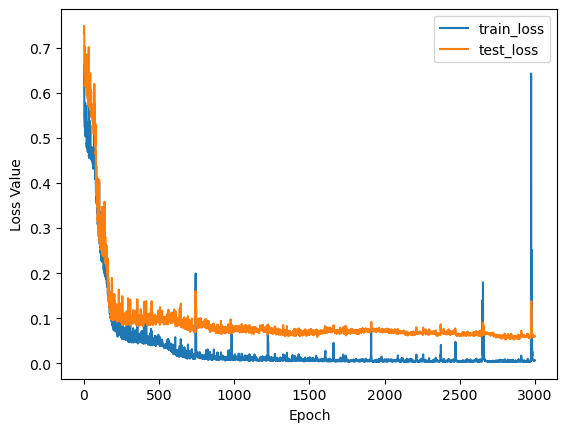

In [37]:
plt.plot(train_loss_list, label='train_loss')
plt.plot(test_loss_list, label = 'test_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
# plt.ylim([0.5, 1])
plt.legend(loc='upper right')
plt.savefig("lossvalue",dpi=1200)
plt.show()


In [42]:
predict_list = []
label_list = []
#Change the "test_dl" to "train_dl" to see the result of the training set
for (X,x_csv, y) in test_dl:
    X, x_csv,y = X.to(device), x_csv.to(device), y.to(device)

    predict_score = big_model(X,x_csv)

    # predict_score = best_model(x)
    predict_list.append(predict_score.flatten().detach().cpu().numpy().flatten())
    label_list.append(y.flatten().detach().cpu().numpy())

predict_array = np.hstack(predict_list)
label_array = np.hstack(label_list)
#predict_array[:5],label_array[:5]

data_to_write2 = np.column_stack((predict_array, label_array))

torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([20, 2, 100])
torch.Size([20, 200])
torch.Size([3, 2, 100])
torch.Size([3, 200])


In [43]:
r2_score(label_array, predict_array)

0.915430550205024

In [44]:
mean_absolute_error(label_array, predict_array)

0.1559364

In [45]:
mean_squared_error(label_array, predict_array)

0.056612097

In [49]:
import csv
data_to_write2 = np.column_stack((predict_array, label_array))
csv_filename = "predictions_and_labels_train-GRU.csv"
with open(csv_filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
   
    # Write title line
    writer.writerow(['Prediction', 'Label'])
    
    # Write data to CSV file
    for row in data_to_write2:
        writer.writerow(row)